In [7]:
# Data Exploration and Analysis

# 1. Setup and Imports
import sys
from pathlib import Path

# Add project root to Python path
project_root = str(Path.cwd().parent)
if project_root not in sys.path:
    sys.path.append(project_root)

# Essential imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import yaml
from src.data.data_processing import DataProcessor

# Configure matplotlib for notebook
%matplotlib inline
plt.style.use('default')

# 2. Load Configuration and Data
# Load configuration
with open('configs/config.yml', 'r') as f:
    config = yaml.safe_load(f)

# Initialize processor and load data
data_processor = DataProcessor('configs/config.yml')
raw_data_path = data_processor.config['data']['raw_data_path']
raw_data_file_name = data_processor.config['data']['raw_data_file_name']

# Load the data
df = data_processor.data_load(f'{raw_data_path}{raw_data_file_name}')


DATA LOADING: Infer data types based on the first 1000 rows

DATA LOADING: Data types inferred count
 float64    1579
object      170
int64         5
Name: count, dtype: int64

In [4]:

# 3. Basic Data Analysis
print("Dataset Info:")
print(df.info())

print("\nMissing Values:")
print(df.isnull().sum())

print("\nDescriptive Statistics:")
print(df.describe())


Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9597 entries, 0 to 9596
Columns: 1754 entries, Unnamed: 0 to vname
dtypes: Int64(5), float64(1517), object(62), string(170)
memory usage: 128.5+ MB
None

Missing Values:
Unnamed: 0                 0
hhcode                     0
gender1                  798
gender2                 1019
gender3                 1296
                        ... 
adjrainfallshifts1_1    8938
adjrainfallshifts2_1    9535
adjrainfallshifts3_1    9580
interviewer             2329
vname                   5558
Length: 1754, dtype: int64

Descriptive Statistics:
        Unnamed: 0           hhcode     gender1      gender2      gender3  \
count       9597.0           9597.0  8799.00000  8578.000000  8301.000000   
mean        4798.0  50851304.412942     1.07660     1.788995     1.449584   
std    2770.559601   28620386.78915     0.26597     0.408046     0.497482   
min            0.0       10010601.0     1.00000     1.000000     1.000000   
25%       

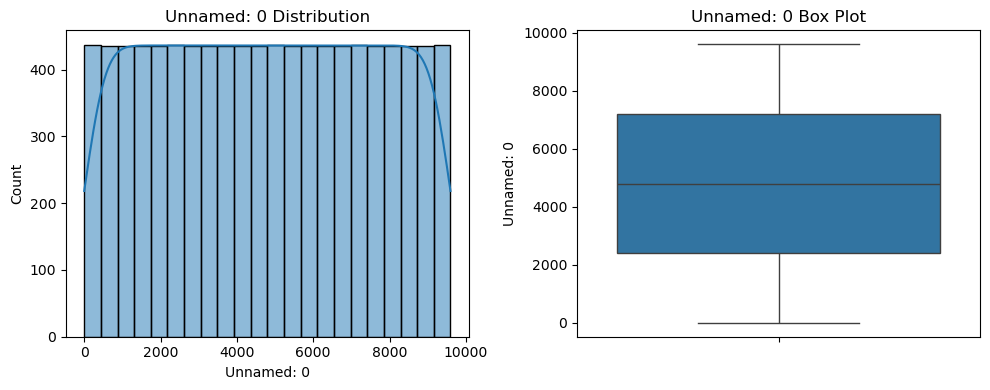

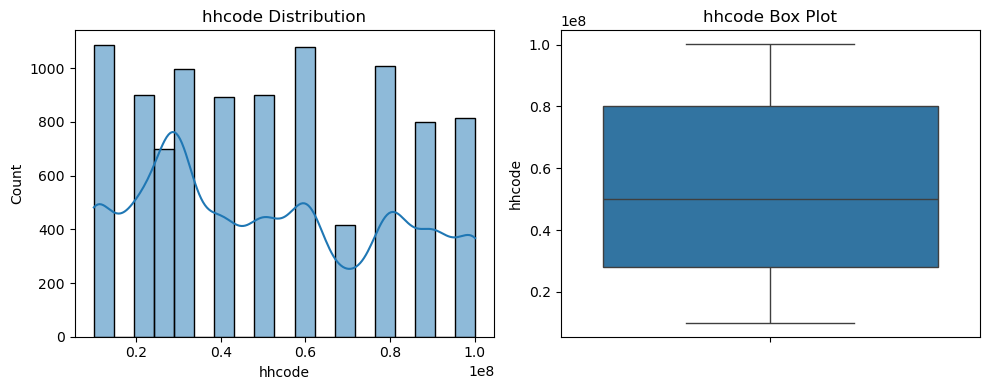

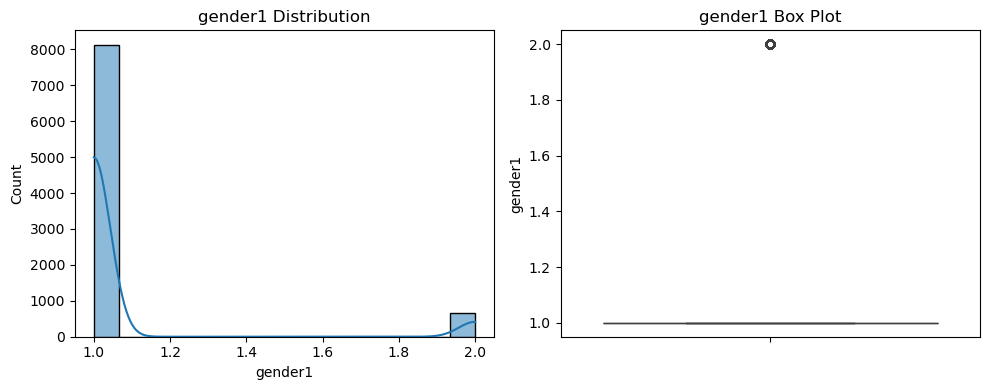

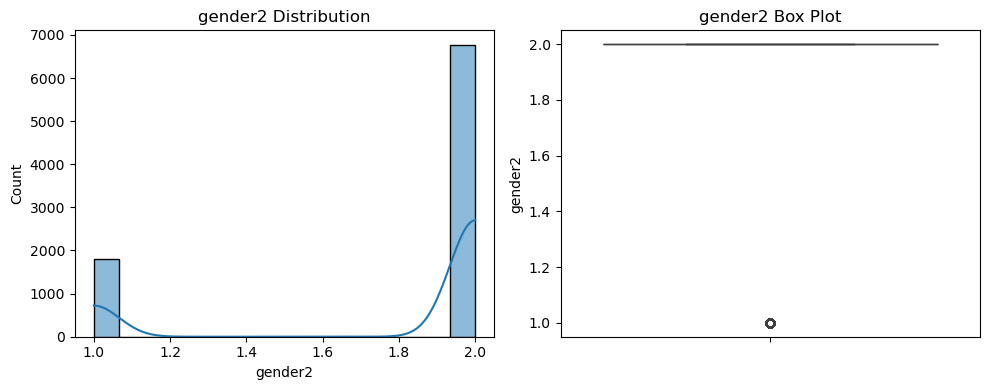

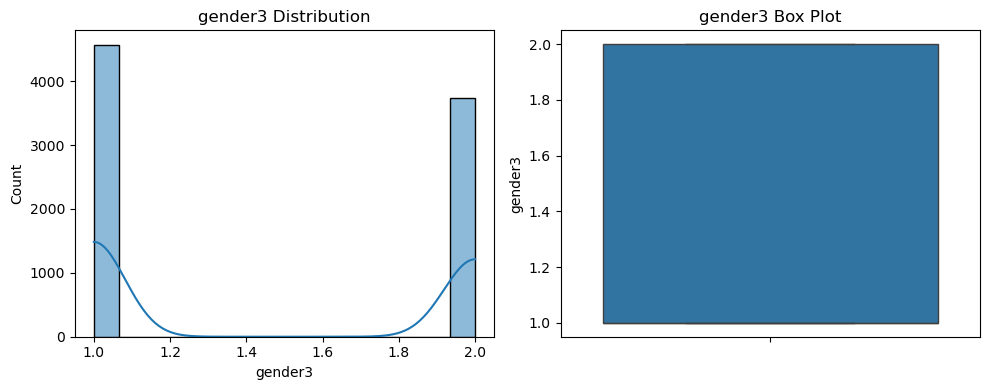

...

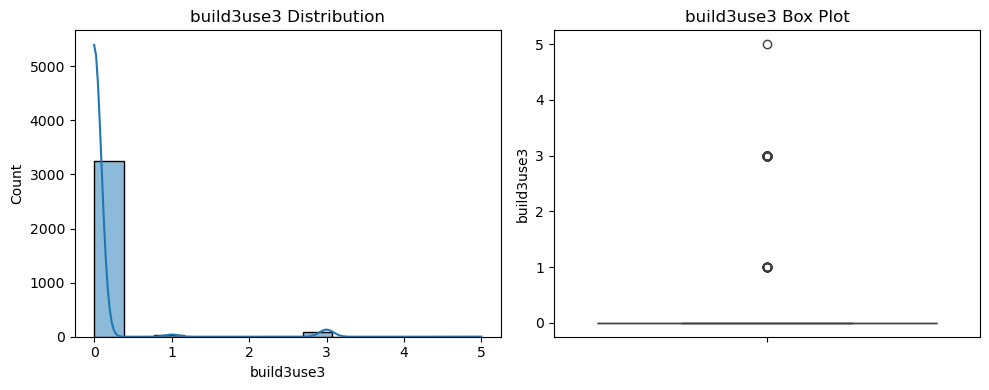

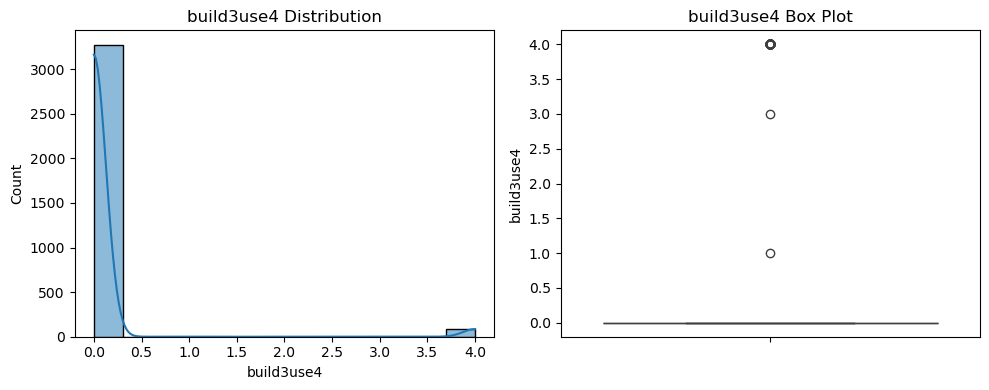

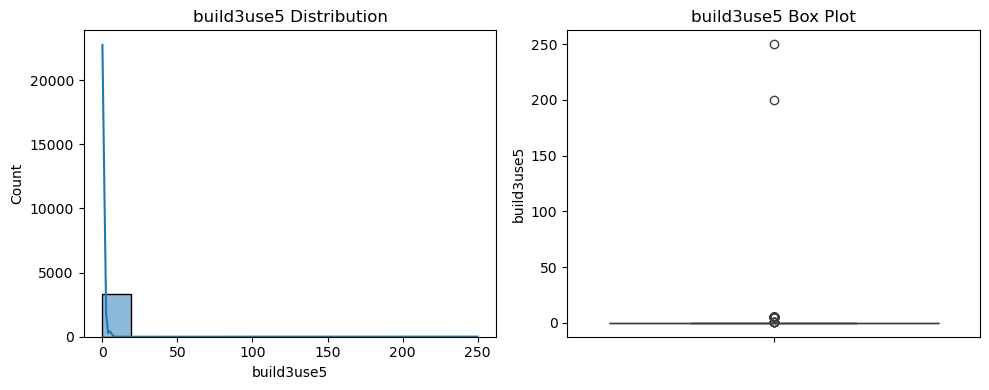

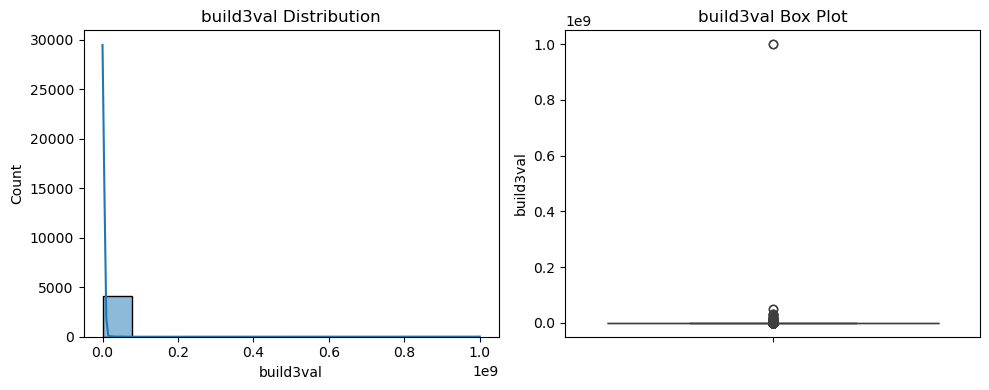

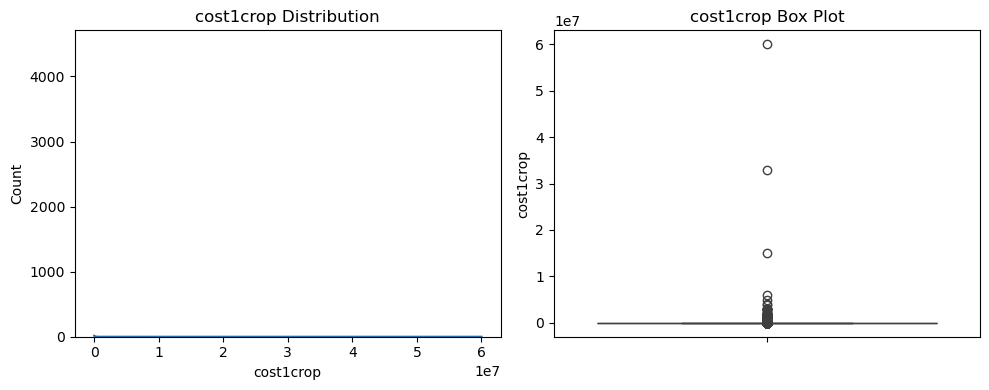

╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>:8                                                                                    │
│                                                                                                  │
│    5 │                                                                                           │
│    6 │   # Distribution plot                                                                     │
│    7 │   plt.subplot(1, 2, 1)                                                                    │
│ ❱  8 │   sns.histplot(df[col], kde=True)                                                         │
│    9 │   plt.title(f'{col} Distribution')                                                        │
│   10 │                                                                                           │
│   11 │   # Box plot                                                                              │
│                                                                                                  │
│ /opt/anaconda3/lib/python3.12/site-packages/seaborn/distributions.py:1416 in histplot            │
│                                                                                                  │
│   1413 │                                                                                         │
│   1414 │   if p.univariate:                                                                      │
│   1415 │   │                                                                                     │
│ ❱ 1416 │   │   p.plot_univariate_histogram(                                                      │
│   1417 │   │   │   multiple=multiple,                                                            │
│   1418 │   │   │   element=element,                                                              │
│   1419 │   │   │   fill=fill,                                                                    │
│                                                                                                  │
│ /opt/anaconda3/lib/python3.12/site-packages/seaborn/distributions.py:571 in                      │
│ plot_univariate_histogram                                                                        │
│                                                                                                  │
│    568 │   │   │   │   # Use matplotlib bar plotting                                             │
│    569 │   │   │   │                                                                             │
│    570 │   │   │   │   plot_func = ax.bar if self.data_variable == "x" else ax.barh              │
│ ❱  571 │   │   │   │   artists = plot_func(                                                      │
│    572 │   │   │   │   │   hist["edges"],                                                        │
│    573 │   │   │   │   │   hist["heights"] - bottom,                                             │
│    574 │   │   │   │   │   hist["widths"],                                                       │
│                                                                                                  │
│ /opt/anaconda3/lib/python3.12/site-packages/matplotlib/__init__.py:1473 in inner                 │
│                                                                                                  │
│   1470 │   @functools.wraps(func)                                                                │
│   1471 │   def inner(ax, *args, data=None, **kwargs):                                            │
│   1472 │   │   if data is None:                                                                  │
│ ❱ 1473 │   │   │   return func(                                                                  │
│   1474 │   │   │   │   ax,                                                                       │
│   1475 │   │   │   │   *map(sanitize_sequence, args),      

In [4]:

# 4. Visualizations
# Numeric features distribution plots
for col in df.select_dtypes(include=[np.number]).columns:
    plt.figure(figsize=(10, 4)) 
    
    # Distribution plot
    plt.subplot(1, 2, 1)
    sns.histplot(df[col], kde=True)
    plt.title(f'{col} Distribution')
    
    # Box plot
    plt.subplot(1, 2, 2)
    sns.boxplot(y=df[col])
    plt.title(f'{col} Box Plot')
    
    plt.tight_layout()
    plt.show()



In [ ]:
# 5. Feature Relationships
# Correlation matrix
numeric_df = df.select_dtypes(include=[np.number])
if not numeric_df.empty:
    plt.figure(figsize=(12, 8))
    sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm')
    plt.title('Feature Correlations')
    plt.show()

# 6. Target Analysis (if applicable)
target_column_name = config['data']['raw_data_target_column']['name']
if target_column_name in df.columns:
    # Pairwise relationships with target
    sns.pairplot(df, hue=target_column_name)
    plt.show()